# Image Style Transfer using Convolutional Neural Networks



---


The implementation is based on the paper "[Image Style Transfer Using Convolutional Neural Networks](https://www.cv-foundation.org/openaccess/content_cvpr_2016/html/Gatys_Image_Style_Transfer_CVPR_2016_paper.html)" by Gatys, Ecker, and Bethge (CVPR 2016). 

---


This paper introduces a CNN-based approach that is able to separate and recombine the style of images.

## Dataset

A pretrained VGG-19 model was used. 

There are 6 *style* images (famous paintings in different styles mentioned in the paper) and 2 content images(shown in the paper) that we would like to transfer the style of *style* images to them.

In [0]:
# Upload imgs.zip file here

from google.colab import files
files.upload()

Saving imgs.zip to imgs.zip


{'imgs.zip': b'PK\x03\x04\x14\x00\x00\x00\x00\x00HS6N\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00 \x00imgs/UT\r\x00\x07\xb8\xe1F\\/\xa2M\\/\xa2M\\ux\x0b\x00\x01\x04\xe8\x03\x00\x00\x04\xe8\x03\x00\x00PK\x03\x04\x14\x00\x00\x00\x00\x00oj;N\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00 \x00imgs/style/UT\r\x00\x07\xd2\xa1M\\4\xa2M\\\xd2\xa1M\\ux\x0b\x00\x01\x04\xe8\x03\x00\x00\x04\xe8\x03\x00\x00PK\x03\x04\x14\x00\x08\x00\x08\x00\x8bU6N\x00\x00\x00\x00\x00\x00\x00\x00m\xb2\x01\x00\x17\x00 \x00imgs/style/d_scream.jpgUT\r\x00\x07\xf7\xe5F\\\xff\xf7F\\\x04\xe6F\\ux\x0b\x00\x01\x04\xe8\x03\x00\x00\x04\xe8\x03\x00\x00\x94\xb9eT\x14\xde\x17.<\x88\xc8O\x10\x10\x18\x94\x14i\x86\x8e\xa1K\xa4\xbb\xbb\x1b\x86\x0eAZ@j\xe8\xa1\x87\x92\x1c\x1ai\x06\x04D\x18Rz\xe8\xd2\xa1\x91\x90n\xb8\xfe\xdf/\xef\xba\x1f\xef>\x1f\xf7Y\xcf9{\x9f\x1d\xcf^\xe7q\xfe\xf1\x17\xe0\xa5\xb2\xbc\x92<\x00\x0b\x0b\x0b`\xf9o\x01\x1e\x1f\x00b2\xdar\xd2\xba\x1a\xda\xa2o\x1dl9!\x1ev\x0eo}y\xb9x\xde\xb2~\xf0vrsx\x

In [0]:
!unzip imgs.zip

Archive:  imgs.zip
   creating: imgs/
   creating: imgs/style/
  inflating: imgs/style/d_scream.jpg  
  inflating: imgs/style/g_jesuiten-iii.jpg  
  inflating: imgs/style/b_shipwreck_of_the_minotaur.jpg  
  inflating: imgs/style/c_starry_night.jpg  
  inflating: imgs/style/f_composition_vii.jpg  
  inflating: imgs/style/e_pablo.jpg  
   creating: imgs/content/
  inflating: imgs/content/neckarfront.jpg  
  inflating: imgs/content/2123694696_bec2d70d4c_b.jpg  


In [0]:
!pip install torch
!pip install torchvision
!pip install --no-cache-dir -I pillow

    100% |████████████████████████████████| 2.0MB 12.8MB/s 
  Found existing installation: Pillow 4.0.0
    Uninstalling Pillow-4.0.0:
      Successfully uninstalled Pillow-4.0.0
  [PIL]
You must restart the runtime in order to use newly installed versions.
    100% |████████████████████████████████| 2.0MB 38.4MB/s 
  [PIL]
You must restart the runtime in order to use newly installed versions.


In [0]:
!ls

imgs  imgs.zip	sample_data


In [0]:
#!unzip imgs.zip

In [0]:
# import resources
%matplotlib inline

from PIL import Image
import matplotlib.pyplot as plt
import numpy as np

import torch
import torch.optim as optim
from torchvision import transforms, models

The features from a pre-trained VGG-19 network are being used, so we don't need the classifier.

In [0]:
# get the "features" portion of VGG19 , we dont need the classifier
vgg = models.vgg19(pretrained=True).features

# freezing all VGG parameters since we're only optimizing the target image
for param in vgg.parameters():
    param.requires_grad_(False)

In [0]:
# View the architecture
vgg

Sequential(
  (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (1): ReLU(inplace)
  (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (3): ReLU(inplace)
  (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (6): ReLU(inplace)
  (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (8): ReLU(inplace)
  (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (11): ReLU(inplace)
  (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (13): ReLU(inplace)
  (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (15): ReLU(inplace)
  (16): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (17): ReLU(inplace)
  (18): MaxPool2d(kernel_size=2, stride=2, padding=0, 

In [0]:
torch.cuda.is_available()

True

In [0]:
# move the model to GPU, if available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

vgg.to(device)

Sequential(
  (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (1): ReLU(inplace)
  (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (3): ReLU(inplace)
  (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (6): ReLU(inplace)
  (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (8): ReLU(inplace)
  (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (11): ReLU(inplace)
  (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (13): ReLU(inplace)
  (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (15): ReLU(inplace)
  (16): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (17): ReLU(inplace)
  (18): MaxPool2d(kernel_size=2, stride=2, padding=0, 

#### Loading Content and Style Images

In [0]:
def load_image(img_path):

    image = Image.open(img_path).convert('RGB')
       
    in_transform = transforms.Compose([
                        transforms.Resize((400,400)),
                        transforms.ToTensor(),
                        transforms.Normalize((0.485, 0.456, 0.406), 
                                             (0.229, 0.224, 0.225))])

    
    # discard the transparent, alpha channel (that's the :3) and add the batch dimension
    image = in_transform(image)[:3,:,:].unsqueeze(0)

    return image

In [0]:
!ls imgs/style
!ls imgs/content

b_shipwreck_of_the_minotaur.jpg  d_scream.jpg  f_composition_vii.jpg
c_starry_night.jpg		 e_pablo.jpg   g_jesuiten-iii.jpg
2123694696_bec2d70d4c_b.jpg  neckarfront.jpg


In [0]:
# load in content and style image
content = load_image('imgs/content/2123694696_bec2d70d4c_b.jpg').to(device)

# Resize style to match content size
style = load_image('imgs/style/g_jesuiten-iii.jpg').to(device)

In [0]:
# Convert a Tensor image to a NumPy image for display
def im_convert(tensor):
    
    image = tensor.to("cpu").clone().detach()
    image = image.numpy().squeeze()
    image = image.transpose(1,2,0)
    image = image * np.array((0.229, 0.224, 0.225)) + np.array((0.485, 0.456, 0.406))
    image = image.clip(0, 1)

    return image

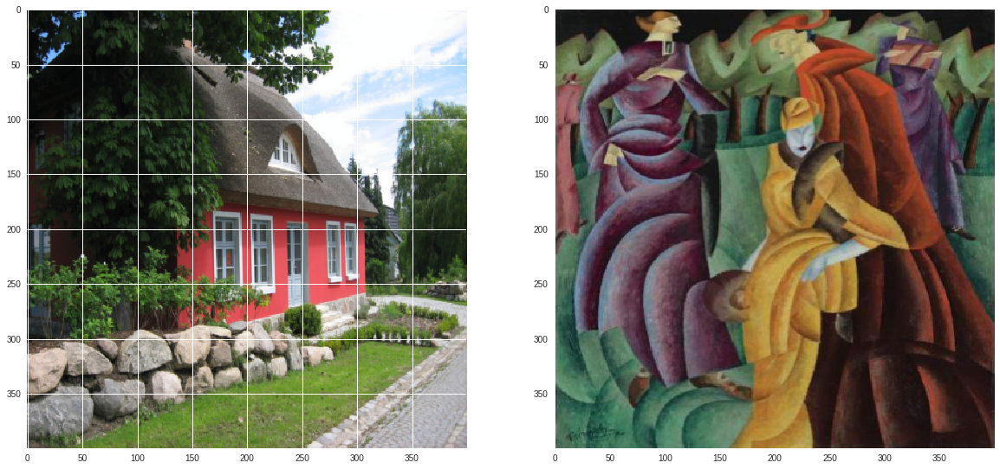

In [0]:
# display the content and style images side-by-side

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))

ax1.imshow(im_convert(content))
plt.grid(None)
ax2.imshow(im_convert(style))

#### Content and Style Features
The layers are used in accordance with those specified in Figure 2 of the paper. The network consists of five convolutional layers with pooling in between.

In [0]:
def get_features(image, model, layers=None):
    if layers is None:
        layers = {'0': 'conv1_1',  # Style
                  '5': 'conv2_1',  # Style
                  '7': 'conv2_2',  # Content
                  '10' : 'conv3_1', # Style
                  '19' : 'conv4_1', # Style
                  '21' : 'conv4_2', # Content
                  '28' : 'conv5_1'  # Style
                 }
        
    features = {}
    x = image

    for name, layer in model._modules.items(): # Dictionary holding each module in the model. Similar to model.forward() step, picking values at certain steps
        x = layer(x)
        if name in layers:
            features[layers[name]] = x
            
    return features

---
#### Calculating Gram Matrix 



In [0]:
def gram_matrix(tensor):

    batch_size, d, h, w = tensor.shape   #(d is the feature maps produced)
    tensor = tensor.view(d, -1)
    gram = torch.mm(tensor, tensor.t())
    
    return gram 

In [0]:

# get content and style features only once before forming the target image
content_features = get_features(content, vgg)
style_features = get_features(style, vgg)

# calculate the gram matrices for each layer of our style representation
style_grams = {layer: gram_matrix(style_features[layer]) for layer in style_features}

## Target can be initialized to different values here
target = content.clone().requires_grad_(True).to(device)

# OTHER OPTIONS OF INITIALIZATION
#style.clone().requires_grad_(True).to(device)
#torch.randn(content.data.size(),requires_grad=True,device=device)

In [0]:
content.data.size()

torch.Size([1, 3, 400, 400])

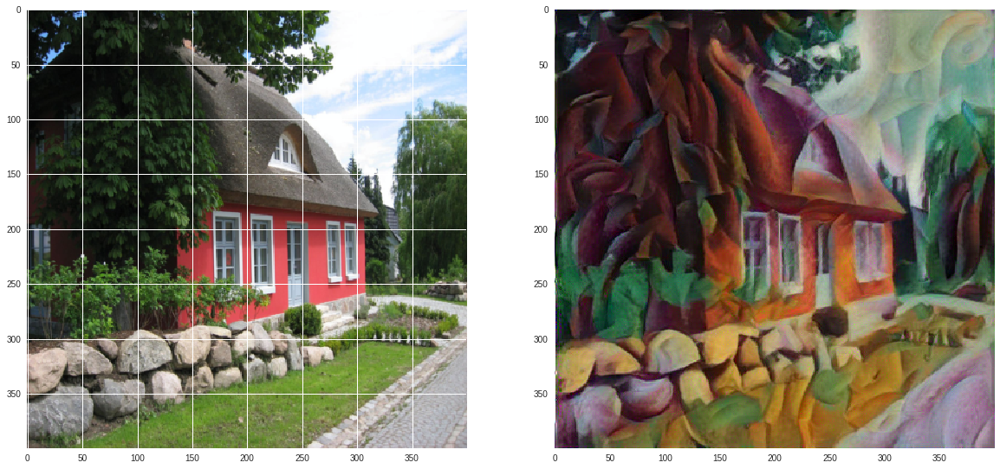

In [0]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
ax1.imshow(im_convert(content))
plt.grid(None)
ax2.imshow(im_convert(target))

---
#### Defining weights

In [0]:
# weights for each style layer 
# and alpha/beta ratio

style_weights = {'conv1_1': 1.,
                 'conv2_1': 0.8,
                 'conv3_1': 0.5,
                 'conv4_1': 0.3,
                 'conv5_1': 0.1}


content_weight = 1  # alpha
style_weight = 1e3  # beta

#### Iterating to update the target & Calculating Losses




1000 tensor(2.5676, device='cuda:0', grad_fn=<MeanBackward1>) tensor(4.9905, device='cuda:0', grad_fn=<AddBackward0>)
Total loss:  4993.08642578125


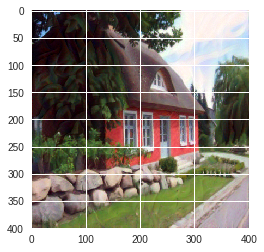

2000 tensor(3.2284, device='cuda:0', grad_fn=<MeanBackward1>) tensor(2.6378, device='cuda:0', grad_fn=<AddBackward0>)
Total loss:  2641.013671875


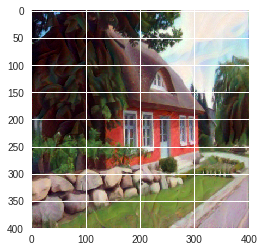

3000 tensor(3.6470, device='cuda:0', grad_fn=<MeanBackward1>) tensor(1.5729, device='cuda:0', grad_fn=<AddBackward0>)
Total loss:  1576.5882568359375


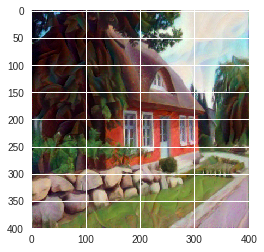

4000 tensor(3.9584, device='cuda:0', grad_fn=<MeanBackward1>) tensor(0.9389, device='cuda:0', grad_fn=<AddBackward0>)
Total loss:  942.902587890625


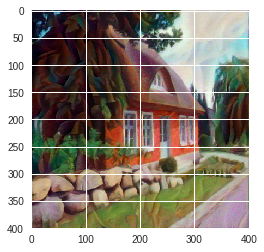

5000 tensor(4.2042, device='cuda:0', grad_fn=<MeanBackward1>) tensor(0.5751, device='cuda:0', grad_fn=<AddBackward0>)
Total loss:  579.2706298828125


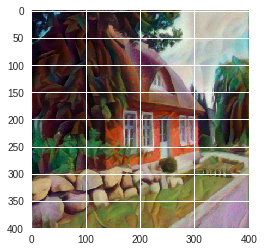

6000 tensor(4.3976, device='cuda:0', grad_fn=<MeanBackward1>) tensor(0.3714, device='cuda:0', grad_fn=<AddBackward0>)
Total loss:  375.77484130859375


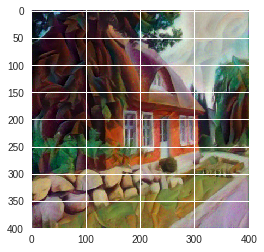

7000 tensor(4.5594, device='cuda:0', grad_fn=<MeanBackward1>) tensor(0.2523, device='cuda:0', grad_fn=<AddBackward0>)
Total loss:  256.896728515625


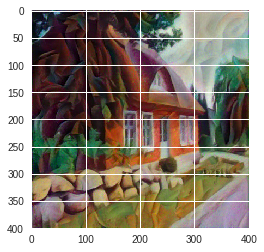

8000 tensor(4.6922, device='cuda:0', grad_fn=<MeanBackward1>) tensor(0.1817, device='cuda:0', grad_fn=<AddBackward0>)
Total loss:  186.3668212890625


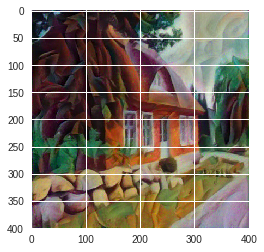

9000 tensor(4.8043, device='cuda:0', grad_fn=<MeanBackward1>) tensor(0.1402, device='cuda:0', grad_fn=<AddBackward0>)
Total loss:  145.01963806152344


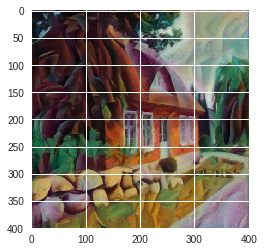

10000 tensor(4.8896, device='cuda:0', grad_fn=<MeanBackward1>) tensor(0.1154, device='cuda:0', grad_fn=<AddBackward0>)
Total loss:  120.3322982788086


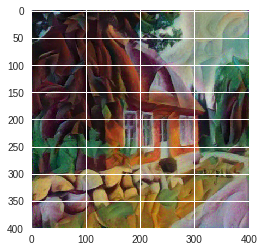

In [0]:
# for displaying the target image, intermittently
show_every = 1000


optimizer = optim.Adam([target])  # learning rate can be changed here
steps = 10000  # this parameter can be changed

for ii in range(1, steps+1):
    
    target_features = get_features(target, vgg)
    content_loss = torch.mean((target_features['conv2_2'] - content_features['conv2_2'])**2)#torch.mean((target_features['conv4_2'] - content_features['conv4_2'])**2)
    

    style_loss = 0
   
    for layer in style_weights:
        
        target_feature = target_features[layer]
        _, d, h, w = target_feature.shape
        
        target_gram = gram_matrix(target_feature)
        
        style_gram = style_grams[layer]
        
        layer_style_loss = style_weights[layer] * torch.mean((target_gram - style_gram)**2)
        
        
        style_loss += layer_style_loss / (d * h * w)
        
    
        
    total_loss = content_weight*content_loss + style_weight*style_loss
    
   
    optimizer.zero_grad()
    total_loss.backward()
    optimizer.step()
        
    
    if  ii % show_every == 0:
        print(ii,content_loss,style_loss)
        print('Total loss: ', total_loss.item())
        plt.imshow(im_convert(target))
        plt.show()

#### Viewing the final output

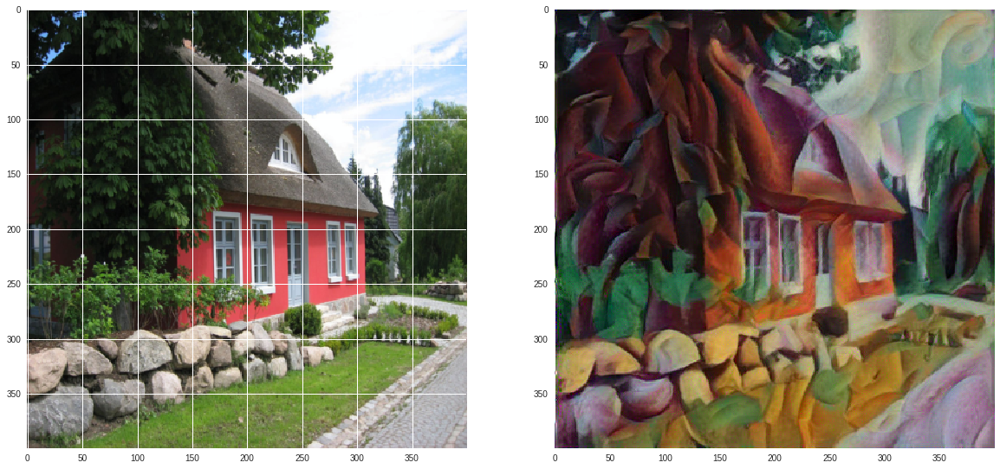

In [0]:
# display content and final, target image
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
ax1.imshow(im_convert(content))
plt.grid(None)
ax2.imshow(im_convert(target))